### configs and imports

In [31]:
from cv2 import imread, resize, cvtColor, COLOR_BGR2RGB
from glob import glob
import numpy as np
import os

# location of input images
images_path = '../images/*'

### clip model

In [2]:
from sentence_transformers import SentenceTransformer, models

clip_model = models.CLIPModel()
model = SentenceTransformer(modules=[clip_model])

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


Moving 11 files to the new cache system


  0%|          | 0/11 [00:00<?, ?it/s]

### read images

In [41]:
image_array, all_files, all_file_paths = [], [], []

for image in glob(images_path):
    all_images_array.append(imread(image))
    all_files.append(os.path.basename(image))
    all_file_paths.append(image)

all_images_array = [x for x in all_images_array if x is not None]

print(f'There are {len(all_images_array)} images in the input directory')

There are 251 images in the input directory


In [14]:
img_array_resized = [np.array(resize(cvtColor(x, COLOR_BGR2RGB), (224,224))) for x in all_images_array]

img_array_resized = np.array(img_array_resized)

len(img_array_resized)

83

In [47]:
img_array_resized.shape

(83, 224, 224, 3)

In [21]:
img = [Image.fromarray(x) for x in img_array_resized]

### get tensor

In [22]:
img_emb = model.encode(img, batch_size=128, convert_to_tensor=True, show_progress_bar=True)

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
img_emb.shape

torch.Size([83, 512])

### clustering

In [25]:
from sklearn.cluster import KMeans

In [27]:
kmeans = KMeans(n_clusters=10, random_state=314).fit(img_emb)

In [34]:
clusters = kmeans.labels_
clusters

array([2, 8, 0, 3, 8, 2, 9, 1, 2, 2, 2, 1, 8, 2, 1, 2, 0, 3, 3, 1, 3, 9,
       6, 1, 6, 5, 8, 3, 5, 4, 7, 6, 4, 6, 1, 2, 5, 6, 1, 4, 7, 8, 8, 1,
       1, 6, 2, 7, 2, 6, 6, 2, 6, 1, 4, 1, 6, 2, 2, 8, 2, 4, 2, 6, 2, 4,
       1, 7, 3, 1, 3, 1, 0, 6, 3, 4, 7, 3, 0, 2, 7, 1, 1], dtype=int32)

In [56]:
vals, ct = np.unique(clusters, return_counts=True)
ct

array([ 4, 16, 17,  9,  7,  3, 12,  6,  7,  2])

In [57]:
vals

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int32)

In [33]:
len(all_files), len(img), len(kmeans.labels_)

(84, 83, 83)

### visualize

In [35]:
import matplotlib.pyplot as plt

All images

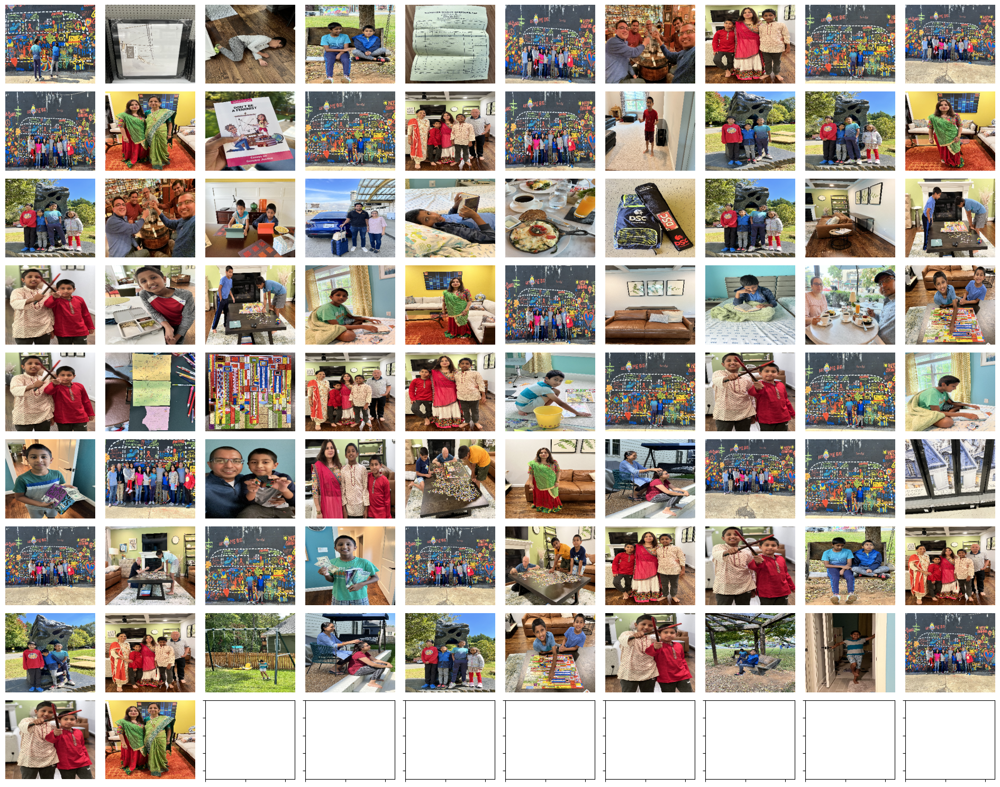

In [52]:
fig, axes = plt.subplots(nrows=9, ncols=10, figsize=(19, 15), sharex=True, sharey=True)

ct = 0
for f, c in zip(all_file_paths, clusters):
    ax = axes.flatten()[ct]
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_aspect('auto')
    ax.imshow(img_array_resized[ct], aspect='auto')
    ax.axis('off')
    ct += 1
    plt.subplots_adjust(wspace=.05, hspace=.05)
    fig.tight_layout()

Images by cluster

0 4
1 16
2 17
3 9
4 7
5 3
6 12
7 6
8 7
9 2


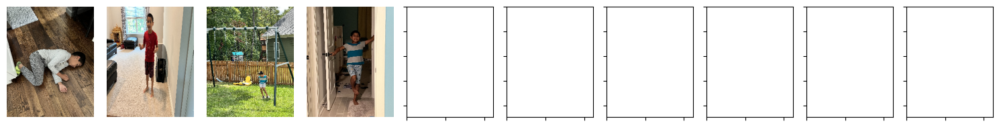

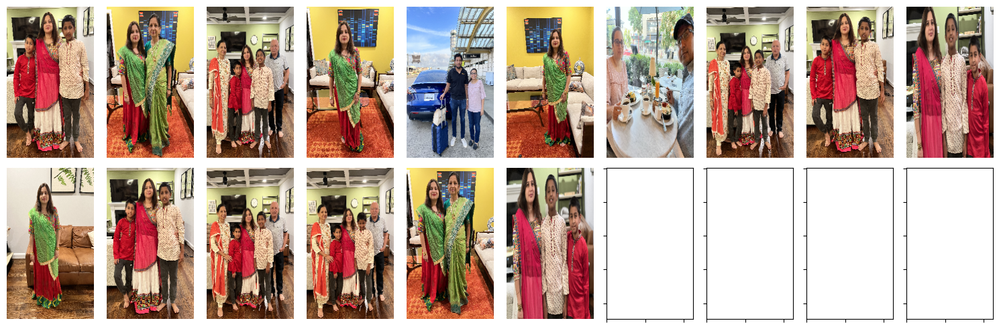

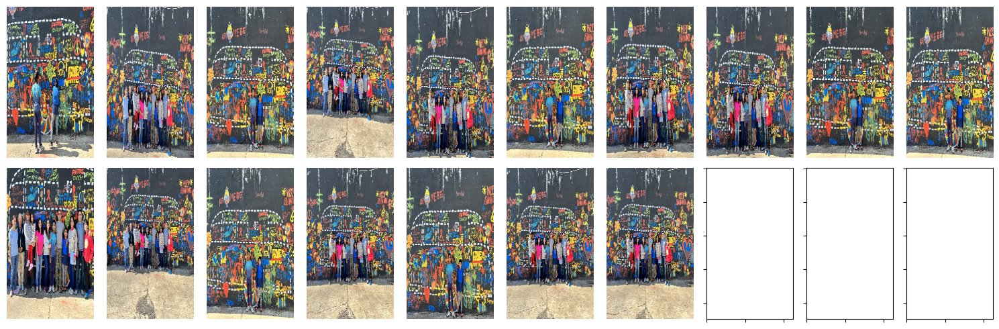

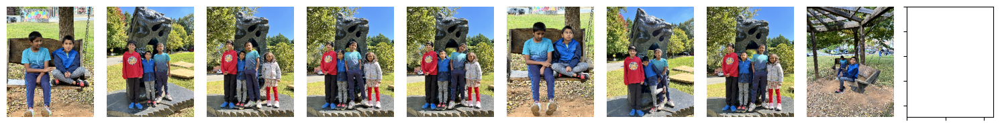

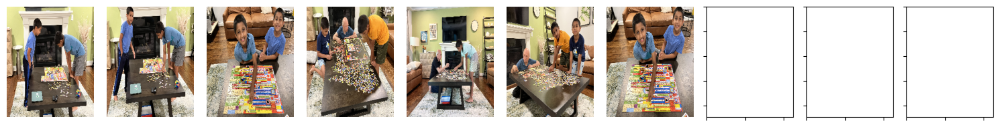

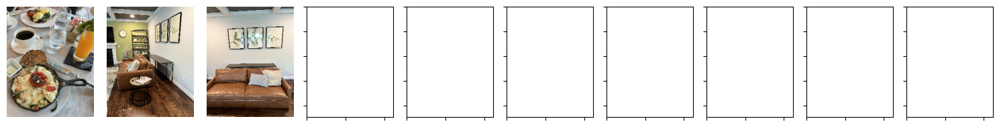

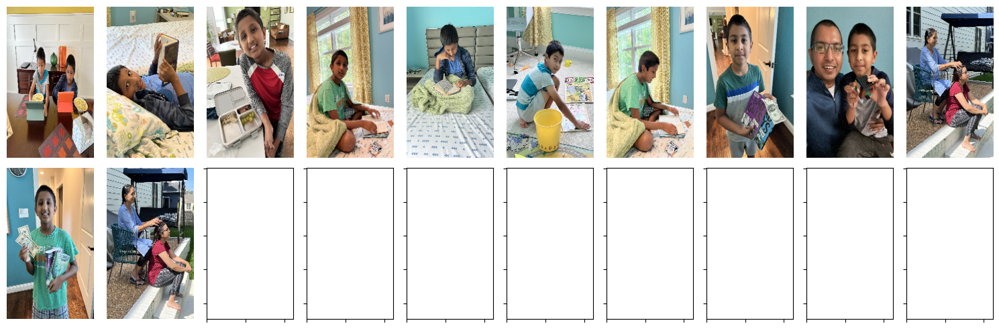

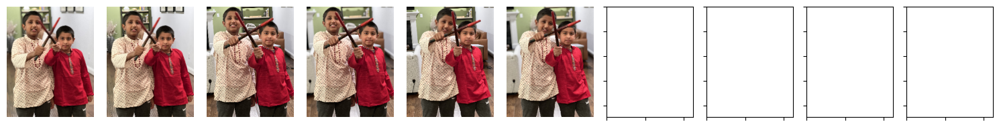

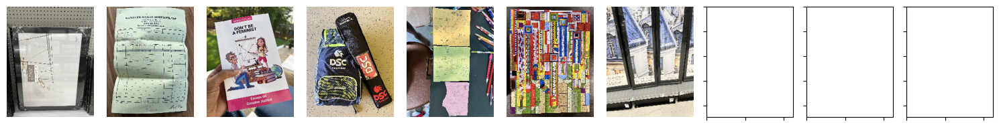

In [70]:
for clus in vals:
    mask = [x == clus for x in clusters]
    clus_images = img_array_resized[mask]
    n = len(clus_images)
    print(clus, n)
    
    if n >= 10:
        rows = 2
        height = 5
    else:
        rows = 1
        height = 2

    fig, axes = plt.subplots(nrows=rows, ncols=10, figsize=(15, height), sharex=True, sharey=True)

    for i, f in enumerate(clus_images):
        ax = axes.flatten()[i]
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('auto')
        ax.imshow(f, aspect='auto')
        ax.axis('off')
        plt.subplots_adjust(wspace=.05, hspace=.05)
        fig.tight_layout()
        
plt.close()